<a href="https://colab.research.google.com/github/greengerong/awesome-llm/blob/main/colab/img/Align_your_steps_sdxl.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 环境

技术论文：[https://research.nvidia.com/labs/toronto-ai/AlignYourSteps](https://research.nvidia.com/labs/toronto-ai/AlignYourSteps)

In [2]:
%%capture
!pip install -q diffusers accelerate

In [3]:
# 由于默认的 DPMSolverMultistepScheduler 不支持设置自定义计划
# 因此增加StableDiffusionPipeline 中的 timesteps 参数来传递我们的自定义计划
import torch
import numpy as np

from diffusers import StableDiffusionPipeline
from diffusers.utils import make_image_grid

from IPython.display import display

from diffusers import DPMSolverMultistepScheduler as DefaultDPMSolver

# Add support for setting custom timesteps
class DPMSolverMultistepScheduler(DefaultDPMSolver):
    def set_timesteps(
        self, num_inference_steps=None, device=None,
        timesteps=None
    ):
        if timesteps is None:
            super().set_timesteps(num_inference_steps, device)
            return

        all_sigmas = np.array(((1 - self.alphas_cumprod) / self.alphas_cumprod) ** 0.5)
        self.sigmas = torch.from_numpy(all_sigmas[timesteps])
        self.timesteps = torch.tensor(timesteps[:-1]).to(device=device, dtype=torch.int64) # Ignore the last 0

        self.num_inference_steps = len(timesteps)

        self.model_outputs = [
            None,
        ] * self.config.solver_order
        self.lower_order_nums = 0

        # add an index counter for schedulers that allow duplicated timesteps
        self._step_index = None
        self._begin_index = None
        self.sigmas = self.sigmas.to("cpu")  # to avoid too much CPU/GPU communication

# SDXL

In [6]:
# 清空显存，便于多次重试
import gc
gc.collect()
torch.cuda.empty_cache()

In [4]:
from diffusers import StableDiffusionXLPipeline, AutoencoderKL

vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16, variant="fp16", use_safetensors=True,
    vae=vae,
    add_watermarker=False,
).to("cuda")

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (84 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['high dynamic range imaging, natural style']
Token indices sequence length is longer than the specified maximum sequence length for this model (84 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['high dynamic range imaging, natural style']


  0%|          | 0/10 [00:00<?, ?it/s]

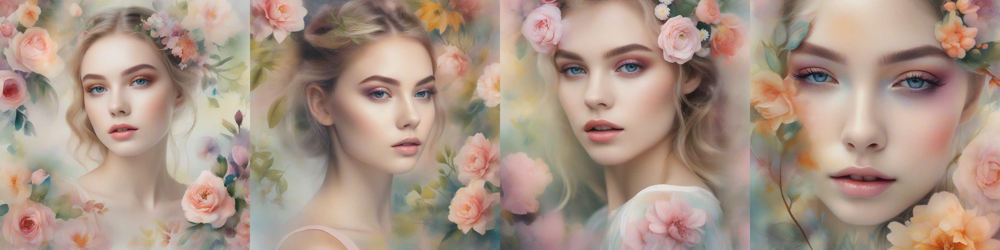

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['high dynamic range imaging, natural style']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['high dynamic range imaging, natural style']


  0%|          | 0/10 [00:00<?, ?it/s]

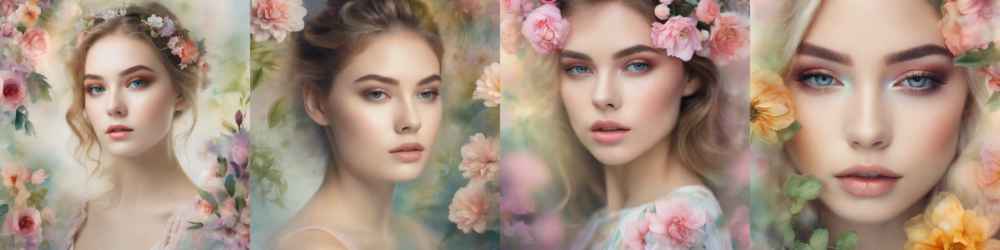

In [7]:
seed = 20
num_steps = 10
sampling_schedule = [999, 845, 730, 587, 443, 310, 193, 116, 53, 13, 0]
# prompt = "a photo of an astronaut riding a horse on mars"
# prompt = "(venus,goddess),(pink and white entanglement),Masterpiece, beautiful details,  uniform 8K wallpaper, high resolution,perfect light,glowing eye,(purple and golden entanglement), (crystal and silver entanglement),Crystal Blue,details,High quality,sfw"
prompt = "A hyperrealistic model with delicate, watercolor-inspired makeup, soft pastel washes on the eyelids and cheeks, against an ethereal, blurred floral background. The gentle, diffuse lighting enhances the watercolor effect, creating a dreamy, serene atmosphere. Created Using: DSLR camera, macro lens for detailed close-ups, watercolor makeup techniques, natural light with reflectors, high dynamic range imaging, natural style"
negative_prompt = "nsfw,glittering top, old, wrinkles, extra fingers, old, imperfect hands, big nose, wrinkles, close up, open mouth, nude, nudity, nsfw, ugly, deformed, noisy, blurry, distorted, out of focus, bad anatomy, extra limbs, poorly drawn face, poorly drawn hands, extra fingers, missing fingers, cartoon 3d gender, videogame, painting, drawing, ugly, deformed, noisy, blurry, distorted, out of focus, bad anatomy, extra limbs, poorly drawn face, poorly drawn hands, missing fingers, photo, realistic, text, watermark, signature, username, artist name, nudity, nude, wrinkles"

# Default schedule
torch.manual_seed(seed)
default_images = pipe(
    prompt, negative_prompt=negative_prompt,
    num_images_per_prompt=4,
    num_inference_steps=num_steps,
).images
display(make_image_grid(default_images, rows=1, cols=len(default_images)))

# AYS schedule
torch.manual_seed(seed)
ays_images = pipe(
    prompt, negative_prompt=negative_prompt,
    num_images_per_prompt=4,
    timesteps=sampling_schedule,
).images
display(make_image_grid(ays_images, rows=1, cols=len(ays_images)))